In [1]:
import argparse
import json
import logging
import math
import os
import warnings
from datetime import date
from pathlib import Path

import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.sparse as sp
import scanpy as sc
import seaborn as sns
from matplotlib.pyplot import rc_context
from spatialdata import read_zarr

/home/ubuntu/miniforge3/envs/annotation/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(


In [2]:
# ruff: noqa
import sys

sys.path.insert(1, "/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark")
import cellseg_benchmark.cell_annotation_utils as anno_utils
from cellseg_benchmark._constants import cell_type_colors
from cellseg_benchmark.dea_utils import add_ensembl_id

In [3]:
# ruff: noqa
import importlib
import cellseg_benchmark.cell_annotation_utils as anno_utils

importlib.reload(anno_utils)

<module 'cellseg_benchmark.cell_annotation_utils' from '/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/cellseg_benchmark/cell_annotation_utils.py'>

In [4]:
plt.rcParams["font.family"] = (
    "Arial" if "Arial" in [f.name for f in fm.fontManager.ttflist] else "sans-serif"
)
plt.rcParams["font.weight"] = "normal"
# see https://medium.com/@daimin0514/how-to-install-the-arial-font-in-linux-9e6ac76d3d9f

today = date.today().strftime("%Y%m%d")

logger = logging.getLogger("annotation")
logger.setLevel(logging.INFO)
handler = logging.StreamHandler()
handler.setLevel(logging.INFO)
handler.setFormatter(logging.Formatter("%(asctime)s [%(levelname)s]: %(message)s"))
logger.addHandler(handler)

In [5]:
# ruff: noqa
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context

plt.rcParams["font.family"] = (
    "Arial" if "Arial" in [f.name for f in fm.fontManager.ttflist] else "sans-serif"
)
plt.rcParams["font.weight"] = "normal"
# see https://medium.com/@daimin0514/how-to-install-the-arial-font-in-linux-9e6ac76d3d9f
import seaborn as sns

[f for f in sorted(fm.get_font_names()) if "Arial" in f]

['Arial', 'Arial Black']

In [6]:
if "SLURM_CPUS_PER_TASK" in os.environ:
    sc.settings.n_jobs = int(os.environ["SLURM_CPUS_PER_TASK"])
    logger.info("Using SLURM_CPUS_PER_TASK={}".format(sc.settings.n_jobs))

warnings.filterwarnings("ignore")

2025-10-14 19:02:29,029 [INFO]: Using SLURM_CPUS_PER_TASK=10


In [7]:
# Mock argparse arguments for Jupyter
class Args:
    sample_name = "foxf2_s2_r1"
    #seg_method = "Cellpose_1_nuclei_model"
    seg_method = "vpt_3D_DAPI_nuclei"
    data_dir = "/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark"
    mad_factor = 3.0
    leiden_res = 10.0


args = Args()

if args.mad_factor <= 0:
    parser.error("--mad_factor must be positive")  # noqa: F821

In [8]:
# Mock argparse arguments for Jupyter
class Args:
    sample_name = "htra1_s6_r1"
    seg_method = "Proseg_Cellpose_1_nuclei_model"
    data_dir = "/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark"
    mad_factor = 3.0
    leiden_res = 10.0


args = Args()

if args.mad_factor <= 0:
    parser.error("--mad_factor must be positive")  # noqa: F821

In [9]:
# Mock argparse arguments for Jupyter
class Args:
    sample_name = "aging_s10_r0"
    seg_method = "Cellpose_1_nuclei_model"
    data_dir = "/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark"
    mad_factor = 3.0
    leiden_res = 10.0


args = Args()

if args.mad_factor <= 0:
    parser.error("--mad_factor must be positive")  # noqa: F821

In [10]:
# Mock argparse arguments for Jupyter
class Args:
    sample_name = "ABCAtlas_s2_r0"
    # seg_method = "Baysor_2D_Cellpose_2_DAPI_PolyT_0.2"
    seg_method = "Cellpose_1_nuclei_model"
    data_dir = "/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark"
    mad_factor = 3.0
    leiden_res = 10.0


args = Args()

if args.mad_factor <= 0:
    parser.error("--mad_factor must be positive")  # noqa: F821

In [8]:
args.sample_name

'foxf2_s2_r1'

In [9]:
args.seg_method

'vpt_3D_DAPI_nuclei'

In [10]:
path = os.path.join(
    args.data_dir, "samples", args.sample_name, "results", args.seg_method
)
annotation_path = os.path.join(path, "cell_type_annotation")
os.makedirs(annotation_path, exist_ok=True)
mmc_dir = os.path.join(annotation_path, "mapmycells_out")
os.makedirs(mmc_dir, exist_ok=True)

In [11]:
logger.info("Loading data...")
adata = read_zarr(os.path.join(path, "sdata.zarr"))["table"]
logger.debug(f"adata columns: {adata.obs.columns}")
adata = adata[:, ~adata.var_names.str.startswith("Blank")]  # remove blank genes
adata.var["gene"] = adata.var.index

2025-10-14 19:02:30,283 [INFO]: Loading data...


In [12]:
adata

AnnData object with n_obs × n_vars = 56449 × 500
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'region', 'slide', 'dataset_id', 'cells_region', 'cell_id'
    var: 'gene'
    uns: 'spatialdata_attrs'
    obsm: 'blank', 'spatial'

In [13]:
adata.var

,gene
Igf2,Igf2
Ngfr,Ngfr
Pdgfra,Pdgfra
Pdgfb,Pdgfb
Sox9,Sox9
...,...
Sod2,Sod2
Nfkb2,Nfkb2
Aqp4,Aqp4
Egfl7,Egfl7


In [14]:
logger.info("Adding ensembl IDs...")
adata.var = add_ensembl_id(
    adata.var, species="mouse", out_col="ensmus_id", logger=logger
)

2025-10-14 19:02:33,572 [INFO]: Adding ensembl IDs...
Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
3 input query terms found no hit:	['Ctps', 'Pifo', 'H2afj']
Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2025-10-14 19:02:37,339 [INFO]: 500 unique symbols -> 500 mapped (100.0%)
2025-10-14 19:02:37,340 [INFO]: Renamed aliases: Ctps->Ctps1, Pifo->Cimap3, H2afj->H2aj


In [15]:
adata.var.head(2)

,gene,ensmus_id
Igf2,Igf2,ENSMUSG00000048583
Ngfr,Ngfr,ENSMUSG00000000120


In [16]:
# mapmycells
pattern = f"MapMyCells_{args.sample_name}_{args.seg_method}.json"
files = [f for f in Path(mmc_dir).glob(f"*{pattern}")]
json_path = max(files, key=os.path.getmtime) if files else None

if json_path:
    logger.info(f"Using existing MapMyCells output: {json_path.name}")
else:
    logger.info("Running MapMyCells using ABC atlas as reference...")
    anno_utils.run_mapmycells(
        adata,
        sample_name=args.sample_name,
        method_name=args.seg_method,
        annotation_path=annotation_path,
        data_dir=args.data_dir,
    )
    json_path = (
        Path(mmc_dir) / f"{today}_MapMyCells_{args.sample_name}_{args.seg_method}.json"
    )

2025-10-14 19:02:37,375 [INFO]: Using existing MapMyCells output: 20250730_MapMyCells_foxf2_s2_r1_vpt_3D_DAPI_nuclei.json


In [17]:
logger.info("Processing MapMyCells output...")
with open(json_path, "rb") as src:
    json_results = json.load(src)
allen_mmc_metadata = anno_utils.process_mapmycells_output(json_results)

anno_utils.plot_metric_distributions(
    allen_mmc_metadata,
    out_path=annotation_path,
    file_name="QC_raw_metric_distributions",
)

2025-10-14 19:02:37,392 [INFO]: Processing MapMyCells output...


In [18]:
# Plot MAD thresholds for SUBC and CLAS (per cell type)
for allen_key, figsize in [("SUBC", (45, 7)), ("CLAS", (13, 7))]:
    anno_utils.plot_mad_thresholds(
        allen_mmc_metadata,
        out_path=annotation_path,
        name=f"QC_mad_threshold_{allen_key}",
        group_column=f"allen_{allen_key}",
        value_column=f"allen_cor_{allen_key}",
        mad_factor=args.mad_factor,
        figsize=figsize,
    )

logger.info("Marking low-quality cells as 'Undefined'...")
# based on correlation MAD as suggested by Allen Institute
taxonomy_levels = ["CLAS", "SUBC", "SUPT", "CLUS"]
prefixes = ["allen", "allen_runner_up_1", "allen_runner_up_2"]
for level in taxonomy_levels:
    for prefix in prefixes:
        anno_utils.mark_low_quality_mappings(
            allen_mmc_metadata,
            target_column=prefix,
            mad_factor=args.mad_factor,
            level=level,
        )

# re-group cell types from *_SUBC
for prefix in prefixes:
    for suffix in ["SUBC", "SUBC_incl_low_quality"]:
        allen_mmc_metadata[f"{prefix}_{suffix}"] = anno_utils.group_cell_types(
            allen_mmc_metadata[f"{prefix}_{suffix}"]
        )

logger.info("Annotating 'mixed' cells based on runner-up probability...")
mixed_df = anno_utils.create_mixed_cell_types(df=allen_mmc_metadata, diff_threshold=0.5)

allen_mmc_metadata = allen_mmc_metadata.merge(
    mixed_df, left_index=True, right_index=True, how="left"
)

2025-10-14 19:02:58,775 [INFO]: Marking low-quality cells as 'Undefined'...
2025-10-14 19:03:06,539 [INFO]: Annotating 'mixed' cells based on runner-up probability...


In [19]:
adata.var.head()

,gene,ensmus_id
Igf2,Igf2,ENSMUSG00000048583
Ngfr,Ngfr,ENSMUSG00000000120
Pdgfra,Pdgfra,ENSMUSG00000029231
Pdgfb,Pdgfb,ENSMUSG00000000489
Sox9,Sox9,ENSMUSG00000000567


In [20]:
# add to adata.obsm
adata.obsm["allen_cell_type_mapping"] = allen_mmc_metadata.loc[adata.obs.index]

In [21]:
# if matrix contains integer-like floats, convert to int64
for name, arr in [("X", adata.X), *adata.layers.items()]:
    values = arr.data if sp.issparse(arr) else np.asarray(arr)
    if np.issubdtype(values.dtype, np.floating) and np.allclose(
        values, np.round(values), rtol=0, atol=1e-8
    ):
        casted = arr.astype(np.int64) if sp.issparse(arr) else arr.astype(np.int64, copy=False)
        if name == "X":
            adata.X = casted
        else:
            adata.layers[name] = casted
        logger.info(f"Converting {name} (integer-like floats) to int64.")

In [22]:
adata

AnnData object with n_obs × n_vars = 56449 × 500
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'region', 'slide', 'dataset_id', 'cells_region', 'cell_id'
    var: 'gene', 'ensmus_id'
    uns: 'spatialdata_attrs'
    obsm: 'blank', 'spatial', 'allen_cell_type_mapping'

In [23]:
adata = anno_utils.process_adata(adata=adata, seg_method=args.seg_method, logger=logger)

2025-10-14 19:03:07,993 [INFO]: Normalizing counts...
2025-10-14 19:03:09,679 [INFO]: Using layer 'zscore' for downstream analysis.
2025-10-14 19:03:09,680 [INFO]: Running dim red...


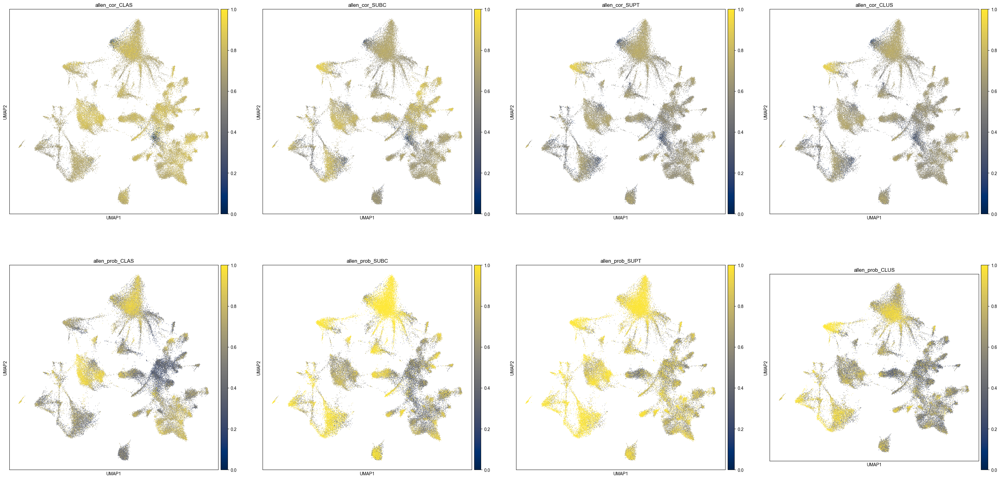

In [24]:
pt_size_umap = 220000 / adata.shape[0]

# plot QC metrics (mapping correlation and probability)
with rc_context({"figure.figsize": (9, 9)}):
    # Copy relevant columns from obsm to obs temporarily
    for col in adata.obsm["allen_cell_type_mapping"].columns:
        adata.obs[col] = adata.obsm["allen_cell_type_mapping"][col]
    sc.pl.umap(
        adata,
        color=[
            "allen_cor_CLAS",
            "allen_cor_SUBC",
            "allen_cor_SUPT",
            "allen_cor_CLUS",
            "allen_prob_CLAS",
            "allen_prob_SUBC",
            "allen_prob_SUPT",
            "allen_prob_CLUS",
        ],
        size=pt_size_umap,
        legend_fontoutline=2,
        legend_fontsize=10,
        ncols=4,
        vmin=0,
        vmax=1,
        cmap="cividis",
        show=False,
    )
    plt.tight_layout()
    plt.gca().set_aspect(1)
    plt.savefig(os.path.join(annotation_path, "UMAP_mapmycells_metrics.png"))
    # plt.close()
    plt.show()
    adata.obs.drop(columns=adata.obsm["allen_cell_type_mapping"].columns, inplace=True)

In [25]:
# plot mixed and low-quality cells on umap and spatial plot
adata.obs["cell_type_mmc_is_low_quality"] = adata.obs[
    "cell_type_mmc_incl_low_quality"
].apply(lambda x: "undefined" if x == "Undefined" else "mapped")
palette_dict = {
    "cell_type_mmc_is_mixed": {"mixed": "red", "unique": "lightgrey"},
    "cell_type_mmc_is_low_quality": {"undefined": "blue", "mapped": "lightgrey"},
}

fig, axes = plt.subplots(
    2, 2, figsize=(18, 16), gridspec_kw={"wspace": 0.15, "hspace": 0.15}
)

keys = ["cell_type_mmc_is_mixed", "cell_type_mmc_is_low_quality"]

for i, key in enumerate(keys):
    palette = palette_dict[key]

    sc.pl.umap(
        adata,
        color=key,
        size=pt_size_umap,
        legend_fontoutline=2,
        legend_fontweight="normal",
        legend_fontsize=7,
        palette=palette,
        ax=axes[0, i],
        show=False,
    )
    axes[0, i].set_aspect("equal")

    sc.pl.embedding(
        adata,
        basis="spatial",
        color=key,
        size=150000 / adata.shape[0],
        legend_loc=None,
        palette=palette,
        ax=axes[1, i],
        show=False,
    )
    axes[1, i].set_aspect("equal")

output_path = os.path.join(
    annotation_path, "UMAP_and_Spatial_mapmycells_mixed_and_undefined.png"
)
plt.savefig(output_path, dpi=200, bbox_inches="tight")
plt.close()
# plt.show()

In [26]:
logger.info(
    "Number of mixed mmc: {}".format(adata.obs["cell_type_mmc_is_mixed"].value_counts())
)
logger.debug(
    "Number of mmc including mixed cells: {}".format(
        adata.obs["cell_type_mmc_incl_mixed"].value_counts()
    )
)
logger.debug(
    "Number of mmc with mixed names: {}".format(
        adata.obs["cell_type_mmc_mixed_names"].value_counts()
    )
)

2025-10-14 19:04:40,499 [INFO]: Number of mixed mmc: cell_type_mmc_is_mixed
unique    49574
mixed      1958
Name: count, dtype: int64


In [27]:
logger.info(
    "Number of low-quality cells: {}".format(
        adata.obs["cell_type_mmc_is_low_quality"].value_counts()
    )
)
logger.debug(
    "Number of cells including low-quality cells: {}".format(
        adata.obs["cell_type_mmc_incl_low_quality"].value_counts()
    )
)

2025-10-14 19:04:40,515 [INFO]: Number of low-quality cells: cell_type_mmc_is_low_quality
mapped       48343
undefined     3189
Name: count, dtype: int64


In [28]:
adata.obs.head(4)

,fov,volume,center_x,center_y,min_x,min_y,max_x,max_y,anisotropy,transcript_count,...,cell_type_mmc_is_mixed,cell_type_mmc_incl_mixed,cell_type_mmc_mixed_names,cell_type_mmc_runner_up_1,cell_type_mmc_runner_up_2,cell_type_mmc_runner_up_1_incl_low_quality,cell_type_mmc_runner_up_2_incl_low_quality,cell_type_mmc_rup1_diff_prob,cell_type_mmc_rup2_diff_prob,cell_type_mmc_is_low_quality
EntityID,,,,,,,,,,,,,,,,,,,,,
2423609000010100006,NaN,169.239772,3247.593989,219.525872,3245.020042,216.530161,3251.006825,222.909537,1.169159,NaN,...,unique,BAMs,BAMs,Immune-Other,Immune-Other,Immune-Other,Immune-Other,0.84,0.89,mapped
2423609000010100010,NaN,484.268065,3241.604763,220.865054,3237.873437,216.669965,3245.803316,225.087644,1.061271,NaN,...,mixed,Mixed,SMCs/VLMCs,VLMCs,Pericytes,VLMCs,Pericytes,0.35,0.37,mapped
2423609000010100015,NaN,442.292753,3205.762264,220.633029,3200.161975,217.657115,3212.159203,223.724110,1.945122,NaN,...,unique,Astrocytes,Astrocytes,Astrocytes,Ependymal,Astrocytes,Ependymal,0.03,0.15,undefined
2423609000010100017,NaN,329.918482,3230.720267,222.255919,3227.302844,218.550136,3234.805865,226.813383,1.665627,NaN,...,unique,VLMCs,VLMCs,NaN,NaN,NaN,NaN,1.00,1.00,mapped


In [29]:
leiden_col = f"leiden_res{args.leiden_res}".replace(".", "_")
leiden_col

'leiden_res10_0'

In [30]:
adata, annotation_results, mmc_leiden_crosstab = anno_utils.revise_annotations(
    adata,
    leiden_res=args.leiden_res,
    leiden_col=leiden_col,
    cell_type_colors=cell_type_colors,
    score_high_threshold=0.5,
    score_low_threshold=0.5,
    score_delta=0.25,
    top_n_genes=50,
    ABCAtlas_marker_df_path=os.path.join(
        args.data_dir,
        "misc",
        "scRNAseq_ref_ABCAtlas_Yao2023Nature",
        "marker_genes_df",
        "20250416_cell_type_markers_top50.csv",
    ),
    logger=logger,
)

2025-10-14 19:04:40,570 [INFO]: Running Leiden clustering with resolution 10.0...
2025-10-14 19:05:52,739 [INFO]: Scoring marker gene expression...
2025-10-14 19:05:52,746 [INFO]:     Choroid-Plexus             (10/50 genes)
2025-10-14 19:05:53,120 [INFO]:     BAMs                       (14/50 genes)
2025-10-14 19:05:53,522 [INFO]:     Ependymal                  (4/50 genes)
2025-10-14 19:05:53,764 [INFO]:     SMCs                       (20/50 genes)
2025-10-14 19:05:54,229 [INFO]:     Microglia                  (14/50 genes)
2025-10-14 19:05:54,611 [INFO]:     Pericytes                  (17/50 genes)
2025-10-14 19:05:55,020 [INFO]:     VLMCs                      (23/50 genes)
2025-10-14 19:05:55,615 [INFO]:     Immune-Other               (11/50 genes)
2025-10-14 19:05:56,010 [INFO]:     ECs                        (23/50 genes)
2025-10-14 19:05:56,611 [INFO]:     ABCs                       (18/50 genes)
2025-10-14 19:05:57,109 [INFO]:     OPCs                       (9/50 genes)
2025-10

In [31]:
pd.set_option("display.max_rows", 150)
mmc_leiden_crosstab

cell_type_mmc_incl_low_quality,Astrocytes,Choroid-Plexus,ECs,Ependymal,Immune-Other,Microglia,Neurons-Dopa,Neurons-Gaba,Neurons-Glut,Neurons-Glyc-Gaba,Neurons-Granule-Immature,OPCs,Oligodendrocytes,Pericytes,SMCs,Undefined,VLMCs,Total
leiden_res10_0,,,,,,,,,,,,,,,,,,
0,0.045317,0.000000,0.034892,0.000000,2.185792,0.000000,0.000000,0.196335,7.826902,0.127389,0.469484,0.000000,0.000000,0.000000,0.000000,2.038257,0.355872,3.085461
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.269854,0.127389,0.000000,0.000000,0.000000,0.000000,0.000000,0.878018,0.000000,2.392688
2,0.120846,0.446429,0.000000,0.777202,1.639344,0.000000,0.000000,0.087260,5.311670,0.000000,2.347418,0.000000,0.000000,0.000000,0.000000,2.947632,0.177936,2.216099
3,17.009063,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.286385,0.000000,0.000000,0.000000,0.000000,0.156789,0.000000,2.208337
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.021815,5.436651,0.127389,0.000000,0.000000,0.000000,0.000000,0.000000,0.501725,0.000000,2.060855
5,0.287009,0.446429,0.034892,0.259067,0.000000,0.000000,0.000000,0.000000,0.093735,0.127389,0.469484,0.000000,10.724355,0.000000,0.000000,0.627156,0.000000,2.041450
6,0.045317,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.301255,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.972092,0.000000,2.041450
7,12.945619,0.446429,0.000000,4.404145,0.546448,0.000000,0.000000,0.109075,0.286414,0.254777,13.145540,0.000000,0.000000,0.000000,0.000000,2.414550,0.177936,2.029807
8,0.151057,0.000000,0.000000,0.518135,0.000000,0.000000,12.380952,1.483421,4.332656,2.929936,2.816901,0.000000,0.010844,0.000000,0.000000,1.975541,0.355872,1.992936


In [32]:
pd.set_option("display.max_rows", 50)

In [33]:
adata.obs = adata.obs.drop(
    columns=[
        "cell_type_revised",
        "cell_type_incl_mixed_revised",
        "cell_type_incl_low_quality_revised",
    ],
    errors="ignore",
)

## plots

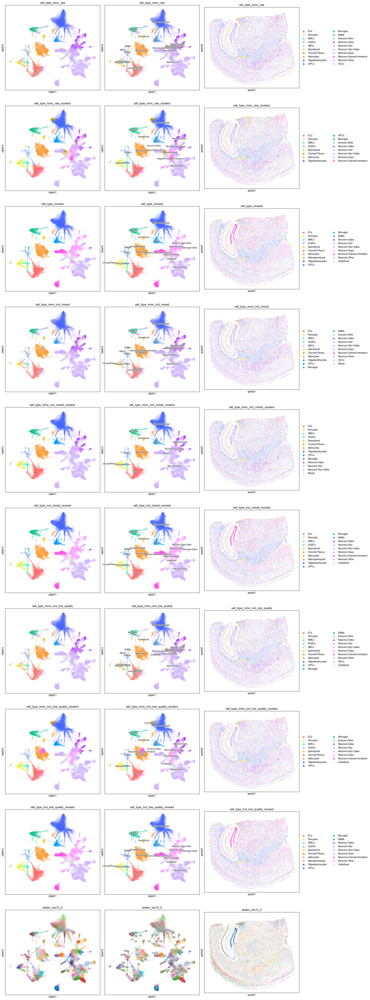

In [34]:
adata.obs.rename(
    columns={
        "cell_type_mmc_raw_revised": "cell_type_revised",
        "cell_type_mmc_incl_mixed_revised": "cell_type_incl_mixed_revised",
        "cell_type_mmc_incl_low_quality_revised": "cell_type_incl_low_quality_revised",
    },
    inplace=True,
)

plot_keys = [
    "cell_type_mmc_raw",
    "cell_type_mmc_raw_clusters",
    "cell_type_revised",
    "cell_type_mmc_incl_mixed",
    "cell_type_mmc_incl_mixed_clusters",
    "cell_type_incl_mixed_revised",
    "cell_type_mmc_incl_low_quality",
    "cell_type_mmc_incl_low_quality_clusters",
    "cell_type_incl_low_quality_revised",
    leiden_col,
]

n_clusters = adata.obs[leiden_col].nunique()
base_colors = (
    sns.color_palette("tab20", 20)
    + sns.color_palette("tab20b", 20)
    + sns.color_palette("tab20c", 20)
    + sns.color_palette("husl", 30)
    + sns.color_palette("Set1", 9)
    + sns.color_palette("Set2", 8)
    + sns.color_palette("Set3", 12)
)
long_palette = (base_colors * ((n_clusters // len(base_colors)) + 1))[:n_clusters]

# consistent category order for cell-type keys
ct_categories = list(cell_type_colors.keys())
for k in plot_keys:
    if k != leiden_col and k in adata.obs:
        adata.obs[k] = pd.Categorical(
            adata.obs[k], categories=ct_categories
        ).remove_unused_categories()

size_umap = pt_size_umap
size_spatial = 110000 / adata.shape[0]


def _plot_row(ax_umap, ax_umap_labels, ax_spatial, key):
    """Plotting helper"""
    is_leiden = key == leiden_col
    palette = long_palette if is_leiden else cell_type_colors

    sc.pl.umap(
        adata,
        color=key,
        size=size_umap,
        palette=palette,
        legend_loc=None,
        legend_fontsize=7,
        legend_fontweight="normal",
        legend_fontoutline=2,
        ax=ax_umap,
        show=False,
    )
    ax_umap.set_aspect("equal")

    sc.pl.umap(
        adata,
        color=key,
        size=size_umap,
        palette=palette,
        legend_loc="on data",
        legend_fontsize=9,
        legend_fontweight="normal",
        legend_fontoutline=1.5,
        ax=ax_umap_labels,
        show=False,
    )
    ax_umap_labels.set_aspect("equal")

    sc.pl.embedding(
        adata,
        basis="spatial",
        color=key,
        size=size_spatial,
        palette=palette,
        legend_loc=None if is_leiden else "right margin",
        ax=ax_spatial,
        show=False,
    )
    ax_spatial.set_aspect("equal")


n_rows = len(plot_keys)
fig, axes = plt.subplots(
    n_rows,
    3,
    figsize=(22, 7.5 * n_rows),
    gridspec_kw={"wspace": 0.05, "hspace": 0.10},
)
axes = np.atleast_2d(axes)
for i, key in enumerate(plot_keys):
    _plot_row(axes[i, 0], axes[i, 1], axes[i, 2], key)

out_png = os.path.join(annotation_path, "UMAP_and_Spatial_annotation_results.png")
# plt.savefig(out_png, dpi=120, bbox_inches="tight")
# plt.close()
plt.show()

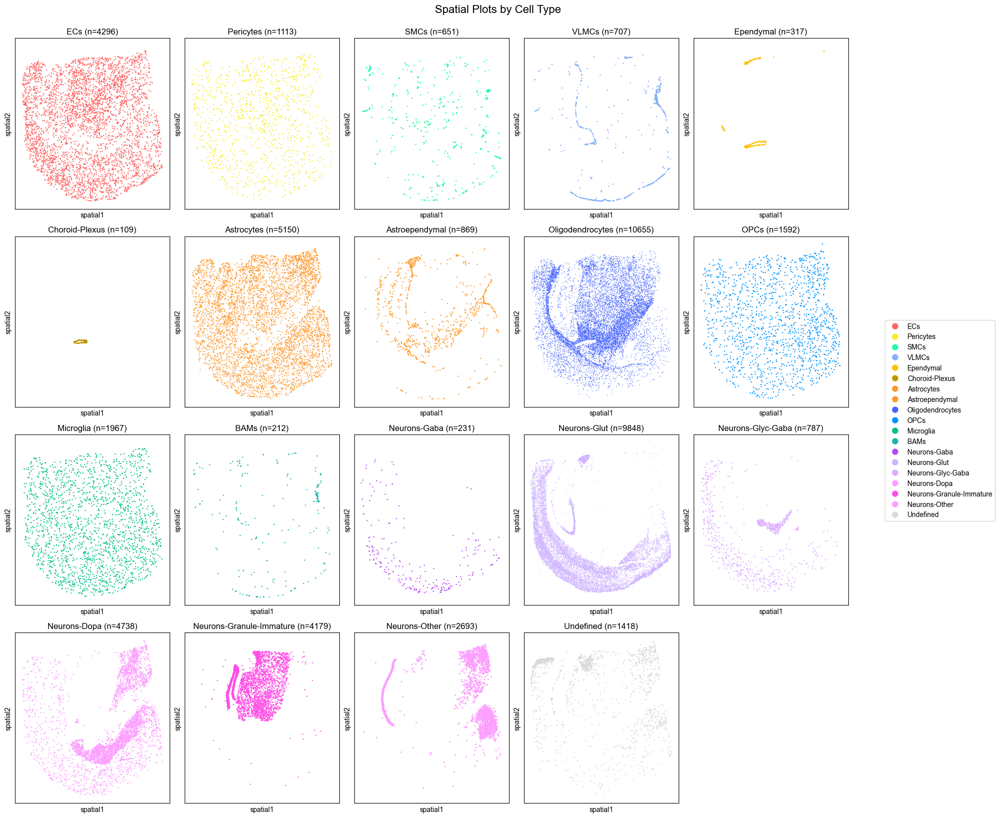

In [35]:
# faceted per–cell type plot
ct_col = "cell_type_revised"
spatial = adata.obsm["spatial"]
cell_types = adata.obs[ct_col].cat.categories
n_types = len(cell_types)
n_cols = math.ceil(math.sqrt(n_types))
n_rows = math.ceil(n_types / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axs = axs.flatten() if n_types > 1 else [axs]

# Spatial limits with margin
x, y = spatial[:, 0], spatial[:, 1]
margin_x, margin_y = 0.05 * (x.max() - x.min()), 0.05 * (y.max() - y.min())
xlim, ylim = (
    (x.min() - margin_x, x.max() + margin_x),
    (y.min() - margin_y, y.max() + margin_y),
)

handles, labels = [], []
for i, ct in enumerate(cell_types):
    if i >= len(axs):
        break
    mask = adata.obs[ct_col] == ct
    if not mask.any():
        continue

    count = mask.sum()
    sc.pl.embedding(
        adata[mask],
        basis="spatial",
        color=ct_col,
        size=12 if count < 2000 else 50000 / count,
        legend_loc=None,
        palette={ct: cell_type_colors.get(ct, "gray")},
        show=False,
        ax=axs[i],
        title=f"{ct} (n={count})",
    )
    axs[i].set_xlim(xlim)
    axs[i].set_ylim(ylim)
    handles.append(
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            markerfacecolor=cell_type_colors.get(ct, "gray"),
            markersize=10,
        )
    )
    labels.append(ct)

for ax in axs[len(cell_types) :]:
    fig.delaxes(ax)

fig.legend(handles, labels, loc="center right", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.subplots_adjust(right=0.85)
plt.suptitle("Spatial Plots by Cell Type", fontsize=16, y=1.02)
plt.savefig(
    os.path.join(annotation_path, f"Spatial_faceted_{ct_col}.png"),
    dpi=200,
    bbox_inches="tight",
)
plt.show()

In [36]:
logger.info("Exporting output...")
mmc_leiden_crosstab.to_csv(
    os.path.join(annotation_path, "mmc_leiden_crosstab_normalized.csv")
)
# subset columns
if "cell_id" not in adata.obs.columns:
    logger.error(f"No cell_ID column. Available columns: {adata.obs.columns}")
adata.obs = adata.obs[
    [
        col
        for col in adata.obs.columns
        if any(substr in col for substr in ["cell_id", "leiden", "score", "cell_type"])
    ]
]
# replace np.nan with "None" for downstream compatibility
na_cols = [
    "cell_type_mmc_runner_up_1",
    "cell_type_mmc_runner_up_2",
    "cell_type_mmc_runner_up_1_incl_low_quality",
    "cell_type_mmc_runner_up_2_incl_low_quality",
]
for col in na_cols:
    if isinstance(adata.obs[col].dtype, pd.CategoricalDtype):
        adata.obs[col] = adata.obs[col].cat.add_categories("None")
    adata.obs[col] = adata.obs[col].fillna("None")

2025-10-14 19:06:26,477 [INFO]: Exporting output...


In [38]:
adata.obs.columns

Index(['cell_id', 'cell_type_mmc_raw', 'cell_type_mmc_incl_low_quality',
       'cell_type_mmc_is_mixed', 'cell_type_mmc_incl_mixed',
       'cell_type_mmc_mixed_names', 'cell_type_mmc_runner_up_1',
       'cell_type_mmc_runner_up_2',
       'cell_type_mmc_runner_up_1_incl_low_quality',
       'cell_type_mmc_runner_up_2_incl_low_quality',
       'cell_type_mmc_rup1_diff_prob', 'cell_type_mmc_rup2_diff_prob',
       'cell_type_mmc_is_low_quality', 'leiden_res10_0',
       'score_Choroid-Plexus', 'score_BAMs', 'score_Ependymal', 'score_SMCs',
       'score_Microglia', 'score_Pericytes', 'score_VLMCs',
       'score_Immune-Other', 'score_ECs', 'score_ABCs', 'score_OPCs',
       'score_Oligodendrocytes', 'score_OECs', 'score_Neurons-Dopa',
       'score_Neurons-Granule-Immature', 'score_Astroependymal',
       'score_Astrocytes', 'score_Neurons-Other', 'score_Tanycytes',
       'score_Neurons-Dopa-Gaba', 'score_Neurons-Gaba',
       'score_Neurons-Glyc-Gaba', 'score_Neurons-Glut',
       '

In [39]:
adata.obs.to_csv(os.path.join(annotation_path, "adata_obs_annotated.csv"), index=False)
logger.info("Done.")

2025-10-14 19:06:52,031 [INFO]: Done.


# clean duplicated mmc output files

Once only

In [25]:
# Keep only the newest MapMyCells outputs per (sample, seg_method) **within each mapmycells_out folder**.
# Set APPLY=True to actually delete files.
BASE_DIR = "/dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/data"
APPLY = True

from pathlib import Path
import re, os
from collections import defaultdict

root = Path(BASE_DIR)
pat = re.compile(
    r"^(?P<date>\d{8})_MapMyCells_(?P<sample>.+?)_(?P<seg>.+?)\.(json|csv)$"
)

to_delete = []

for out_dir in root.glob("samples/*/results/*/cell_type_annotation/mapmycells_out"):
    if not out_dir.is_dir():
        continue
    # collect files in this one folder
    by_key = defaultdict(list)  # key=(sample, seg) -> [(date, Path)]
    for f in out_dir.iterdir():
        if not f.is_file():
            continue
        m = pat.match(f.name)
        if m:
            key = (m["sample"], m["seg"])
            by_key[key].append((m["date"], f))
    # decide deletions per (sample, seg) group *in this folder*
    for key, items in by_key.items():
        if len(items) < 2:
            continue
        latest = max(d for d, _ in items)
        to_delete.extend([p for d, p in items if d != latest])

if not to_delete:
    print(
        "Nothing to delete. (Check BASE_DIR and file naming: YYYYMMDD_MapMyCells_<sample>_<seg>.(json|csv))"
    )
else:
    print("Planned deletions (older dates):")
    for p in sorted(to_delete):
        print(" -", p)
    if APPLY:
        removed = 0
        for p in to_delete:
            try:
                os.remove(p)
                removed += 1
            except Exception as e:
                print(f"ERROR deleting {p}: {e}")
        print(f"Deleted {removed} files.")
    else:
        print("\nDry-run. Set APPLY=True to delete.")

Planned deletions (older dates):
 - /dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/data/samples/aging_s10_r0/results/Baysor_2D_Cellpose_2_DAPI_PolyT_0.2/cell_type_annotation/mapmycells_out/20250629_MapMyCells_aging_s10_r0_Baysor_2D_Cellpose_2_DAPI_PolyT_0.2.csv
 - /dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/data/samples/aging_s10_r0/results/Baysor_2D_Cellpose_2_DAPI_PolyT_0.2/cell_type_annotation/mapmycells_out/20250629_MapMyCells_aging_s10_r0_Baysor_2D_Cellpose_2_DAPI_PolyT_0.2.json
 - /dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/data/samples/aging_s10_r0/results/Baysor_2D_Cellpose_2_DAPI_PolyT_0.8/cell_type_annotation/mapmycells_out/20250629_MapMyCells_aging_s10_r0_Baysor_2D_Cellpose_2_DAPI_PolyT_0.8.csv
 - /dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark/data/samples/aging_s10_r0/results/Baysor_2D_Cellpose_2_DAPI_PolyT_0.8/cell_type_annotation/mapmycells_out/20250629_MapMyCells_aging_s10_r0_Baysor_2D_Cellpose_2_DAPI_PolyT_0.8.json
 - /dss/dsshome1/0C/ra98gaq/Git/cellseg-benchmark

# compare detected_transcripts.csv s 

In [45]:
# ABC_S1_r0
df = pd.read_csv(
    "/dss/dssfs03/pn52re/pn52re-dss-0001/merfish-public-data/ABCAtlas-MouseBrain-500plex/1199650959/detected_transcripts.csv"
)
df.shape

(47677230, 11)

In [46]:
df

,Unnamed: 0,barcode_id,global_x,global_y,global_z,x,y,fov,gene,transcript_id,cell_id
0,216452,65,107.83527,4415.7330,0.0,1189.82470,1881.80330,2,Pth2r,ENSMUST00000027083,-1
1,221032,65,593.64050,5260.4730,0.0,1914.47160,450.42587,13,Pth2r,ENSMUST00000027083,-1
2,213013,65,771.51746,3908.0767,0.0,1806.00000,950.17510,28,Pth2r,ENSMUST00000027083,1018093344101530062
3,231605,65,616.74850,4424.0510,0.0,332.29376,167.00000,31,Pth2r,ENSMUST00000027083,-1
4,226001,65,677.11676,4906.2026,0.0,864.22970,914.75370,33,Pth2r,ENSMUST00000027083,-1
...,...,...,...,...,...,...,...,...,...,...,...
47677225,2046219,526,7944.88770,1295.1528,6.0,1616.17430,1399.62490,1083,Blank-27,Blank-27,-1
47677226,2046243,526,7930.18070,1318.1603,6.0,1480.00000,1612.65720,1083,Blank-27,Blank-27,-1
47677227,1952079,526,7989.55660,1189.6870,6.0,173.60612,433.20062,1121,Blank-27,Blank-27,-1
47677228,1952145,526,8012.13500,1270.9326,6.0,382.66428,1185.47500,1121,Blank-27,Blank-27,-1


In [47]:
df.gene.nunique()

550

In [48]:
df[df.cell_id != -1].gene.nunique()

550

In [49]:
df.dtypes

Unnamed: 0         int64
barcode_id         int64
global_x         float64
global_y         float64
global_z         float64
x                float64
y                float64
fov                int64
gene              object
transcript_id     object
cell_id            int64
dtype: object

In [34]:
# foxf2_s2_r1
df = pd.read_csv(
    "/dss/dssfs03/pn52re/pn52re-dss-0000/202402-Foxf2/merfish_output/20240322_Foxf2-Slide02-cp-WT-PCKO/region_1-WT536/detected_transcripts.csv"
)
df.shape

(66676355, 11)

In [35]:
df

,Unnamed: 0,barcode_id,global_x,global_y,global_z,x,y,fov,gene,transcript_id,cell_id
0,107,0,7136.47560,2356.3298,0.0,987.39746,1628.00000,461,Igf2,ENSMUST00000000033,1865558700069100825
1,22,8,7138.10940,2360.3838,0.0,1002.52606,1665.53660,461,Cfp,ENSMUST00000001156,1865558700069100825
2,84,44,7136.97270,2356.9917,0.0,992.00000,1634.12760,461,Slc3a2,ENSMUST00000010239,1865558700069100825
3,85,44,7135.13600,2357.4858,0.0,975.00000,1638.70290,461,Slc3a2,ENSMUST00000010239,1865558700069100825
4,79,45,7137.83640,2359.2458,0.0,1000.00000,1655.00000,461,Slc47a1,ENSMUST00000010267,1865558700069100825
...,...,...,...,...,...,...,...,...,...,...,...
66676350,246,128,365.51303,2480.4158,4.0,1792.00000,1235.75120,1302,Slc7a11,ENSMUST00000029297,-1
66676351,31,139,354.38904,2393.4180,4.0,1689.00000,430.21637,1302,Spp1,ENSMUST00000031243,-1
66676352,290,376,333.12042,2543.9292,4.0,1492.06840,1823.83850,1302,Xirp1,ENSMUST00000111635,-1
66676353,284,128,245.56311,2495.7786,5.0,681.35254,1378.00000,1302,Slc7a11,ENSMUST00000029297,-1


In [36]:
df.gene.nunique()

550

In [39]:
df[df.cell_id != -1].gene.nunique()

550

In [44]:
df.dtypes

Unnamed: 0         int64
barcode_id         int64
global_x         float64
global_y         float64
global_z         float64
x                float64
y                float64
fov                int64
gene              object
transcript_id     object
cell_id            int64
dtype: object